# Proglearn: Scene Segmentation (Neural Network)

Neuro Data Design I: Fall 2021

This tutorial provides a walkthrough for applying a neural network (Unet architecture) for scene segmentation. Following this, an attempt was made to apply this same architecture to the Proglearn framework.

In [1]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
from utils import utils_ade20k

from nnfunctions import * # cv2 required
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Input
from tensorflow.keras.utils import Sequence
import pickle as pkl

2022-02-09 21:53:12.795223: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Preprocessing

Images from the ADE20K consistency set are used in this exercise, which contains 64 images where different objects in the scene are segmented into different colors. However, between different images, the same objects do not necessarily share the same color. As a result, the preprocessing step not only involves separating the data into train and test sets but also relabeling pixel values from color values to class values.

In [4]:
# data directory
DATASET_PATH="../../ADE20K_2021_17_01"
index_file = "index_ade20k.pkl"
with open('{}/{}'.format(DATASET_PATH, index_file), 'rb') as f:
    index_ade20k = pkl.load(f)

n_classes = len(index_ade20k['objectnames'])

# get image file names
training_files = ["../../{}/{}".format(i, j) for i,j in zip(index_ade20k['folder'], index_ade20k['filename']) if "training" in i]
validation_files = ["../../{}/{}".format(i, j) for i,j in zip(index_ade20k['folder'], index_ade20k['filename']) if "validation" in i]

Preprocessing function for obtaining image mask.

In [5]:
from tensorflow.keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img

def get_mask(image):
    # Obtain the segmentation mask, bult from the RGB channels of the _seg file
    R = image[:,:,0]
    G = image[:,:,1]
    B = image[:,:,2]
    return (R/10).astype(np.int32)*256+(G.astype(np.int32))

class DataLoader(Sequence):
    def __init__(self, batch_size, img_size, input_img_paths):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths

    def __len__(self):
        return len(self.input_img_paths) // self.batch_size

    def __getitem__(self, idx):
        i = idx * self.batch_size

        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_mask_img_paths = [i.replace('.jpg', '_seg.png') for i in self.input_img_paths[i : i + self.batch_size]]
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size=self.img_size)
            x[j] = img
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_mask_img_paths):
            img = get_mask(img_to_array(load_img(path, target_size=self.img_size)))
            y[j] = np.expand_dims(img, 2)
        return x, y

Using TensorFlow backend.


The images are loaded and preprocessed

Hyper parameters for training:

- `n_epoch`: number of training epochs
- `n_batch_items`: number of training points per epoch
- `n_test`: number of testing points
- `n_val`: number of validation points
- `learn_rate`: learning rate

In [7]:
# hyperparameters
n_epoch = 10
n_batch_items = 16
n_test = 10
n_val = 10
learn_rate = 0.001

[ 39  45 103]


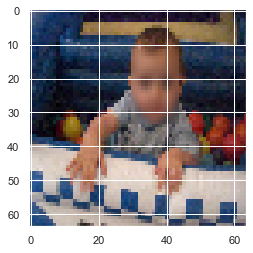

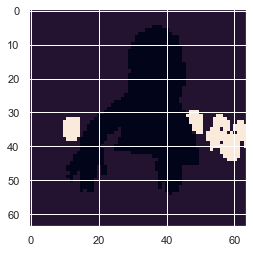

In [17]:
# create data loaders
training_data = DataLoader(n_batch_items, (64, 64), training_files[:100])
validation_data = DataLoader(n_batch_items, (64, 64), validation_files)
x, y = training_data[0]
print(np.unique(y[4]))
plt.figure()
plt.imshow(x[4].astype(np.uint8))
plt.figure()
plt.imshow(y[4].astype(np.uint8))

Create neural network (Unet)

In [6]:
# create Unet model
input_layer = Input(shape = x[0].shape)
model = unet(input_layer, n_classes)

2022-02-09 20:17:29.344667: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-02-09 20:17:29.345326: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-02-09 20:17:30.687676: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-09 20:17:30.687798: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 3060 Laptop GPU computeCapability: 8.6
coreClock: 1.282GHz coreCount: 30 deviceMemorySize: 5.81GiB deviceMemoryBandwidth: 268.26GiB/s
2022-02-09 20:17:30.687837: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2022-02-09 20:17:30.690247: I tensorflow/stream_executor/

## Neural Network

A Unet neural network is constructed, which is a type of neural network used in image segmentation commonly used in biomedical applications. This network uses the Adam optimizer and computes loss via Sparse Categorical Crossentropy. An aditional metric called the Dice score iis also computed, which calculates the similarity between the predicted segmentation and the ground truth segmentation.

In [8]:
# compile model with Adam optimizer, Spare Categorical Cross entropy loss, and include dice coefficient calculation
model.compile(optimizer=Adam(learning_rate=learn_rate),
              loss=SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy', dice])

### Training

The Unet model is trained according to the hyperparameters previously specified.

In [ ]:
# compile model with Adam optimizer, Spare Categorical Cross entropy loss, and include dice coefficient calculation
model_history = model.fit(
                        training_data,
                        epochs=n_epoch, 
                        batch_size = n_batch_items, 
                        verbose=1)

2022-02-09 20:22:19.419723: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-02-09 20:22:19.436328: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3295010000 Hz


Epoch 1/10


2022-02-09 20:22:20.614194: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7


In [9]:
def visualize_mask(image):
    return 0

def evaluate(model, X_test, Y_test):
    dices = np.zeros(len(X_test))
    accuracy = np.zeros(len(X_test))
    mut_info = np.zeros(len(X_test))
    for i in np.arange(len(X_test)):
        m = tf.keras.metrics.Accuracy()
        pred = model.predict(tf.convert_to_tensor([X_test[i]]))
        score = dice(Y_test[i], pred)
        plt.figure(figsize=(16, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(tf.cast(X_test[i], tf.int32))
        plt.title("Image")
        plt.subplot(1,3,2)
        plt.imshow(Y_test[i].reshape(256,256), cmap = "Set1")
        plt.title("Ground Truth Segmentation Mask")
        plt.subplot(1,3,3)
        plt.imshow(np.argmax(pred, axis=3).reshape(256,256), cmap= "Set1")
        plt.title("Predicted Mask (Dice: {:.4f})".format(score.numpy()))
        dices[i] = score.numpy()
        m.update_state(Y_test[i].flatten(), np.argmax(pred, axis=3).flatten())
        accuracy[i] = m.result().numpy()
    print("Mean Test Dice: {:.4f}".format(np.mean(dices)))
    print("Mean Test Accuracy: {:.4f}".format(np.mean(accuracy)))

def plot_metrics(history):
    epochs = history.epoch
    plt.figure(figsize=(22,5))

    plt.subplot(1,3,1)
    plt.plot(epochs, history.history['loss'], label="Training Loss")
    plt.plot(epochs, history.history['val_loss'], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Sparse Categorical Cross Entropy Loss")
    plt.title("Loss vs. Epoch")
    plt.legend()

    plt.subplot(1,3,2)
    plt.plot(epochs, history.history['accuracy'], label="Training Accuracy")
    plt.plot(epochs, history.history['val_accuracy'], label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy vs. Epoch")
    plt.legend()
    plt.subplot(1,3,3)
    plt.plot(epochs, history.history['dice'], label="Training Dice")
    plt.plot(epochs, history.history['val_dice'], label="Validation Dice")
    plt.legend()
    plt.xlabel("Epoch")
    plt.ylabel("Dice Coefficient")
    plt.title("Dice Coefficient vs. Epoch")
plot_metrics(model_history)

NameError: name 'model_history' is not defined

### Testing

With the model now trained, predictions are made with the model to evaluate its accuracy.

Evaluation on held-out testing data:

Mean Test Dice: 0.0002
Mean Test Accuracy: 0.0107


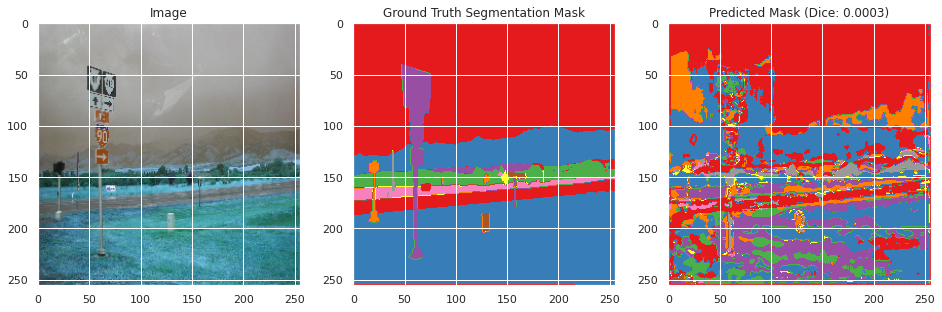

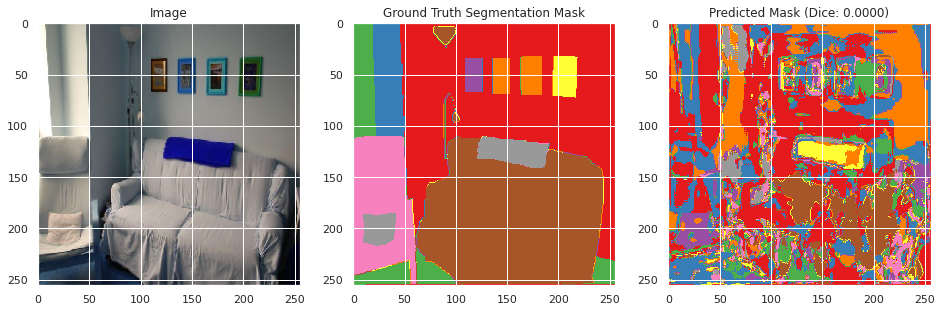

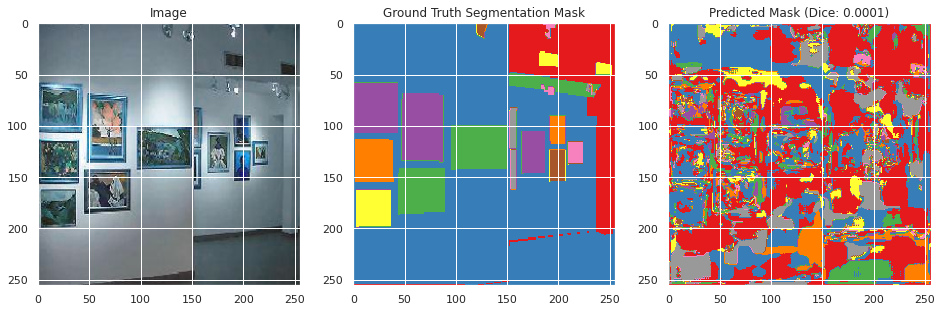

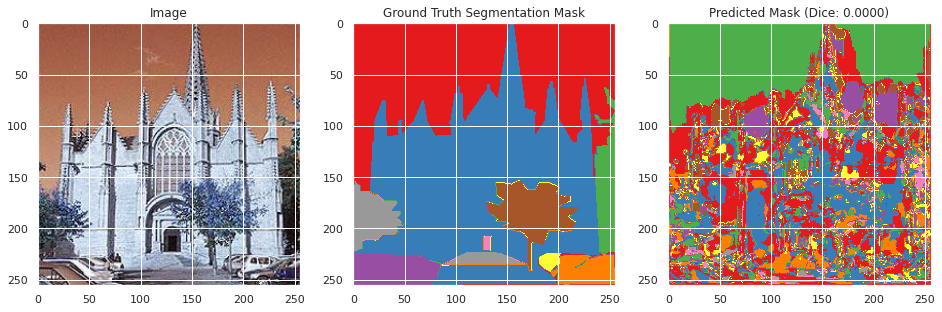

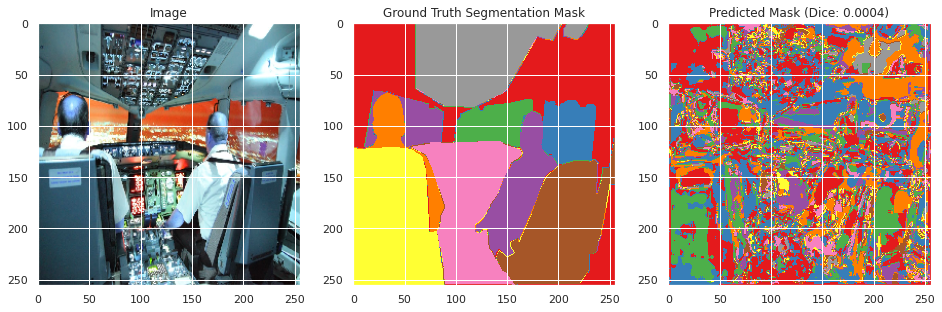

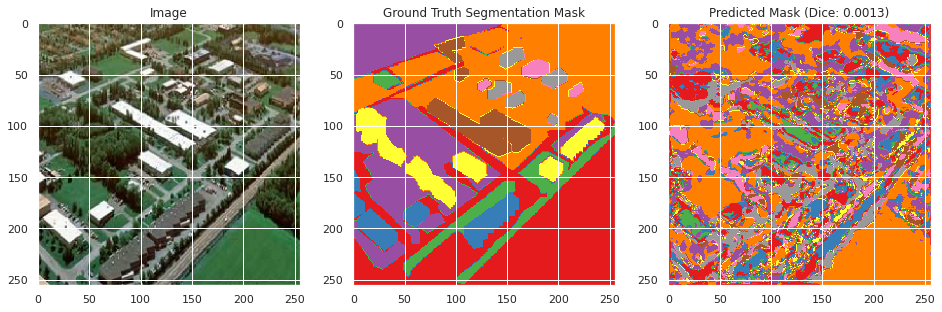

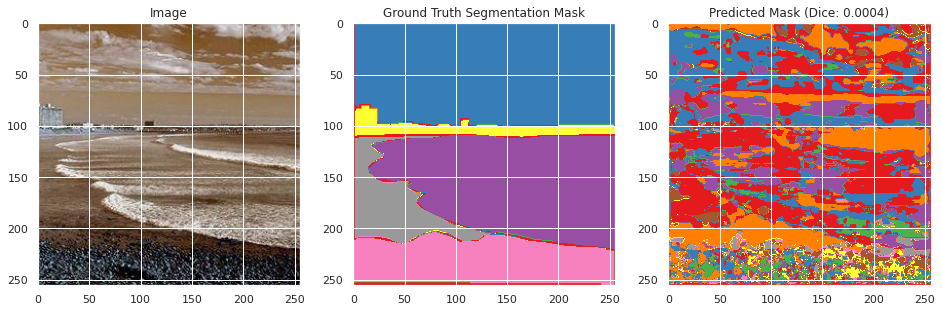

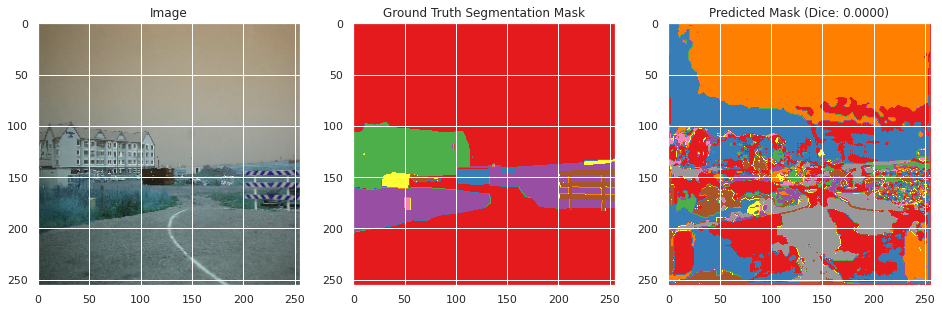

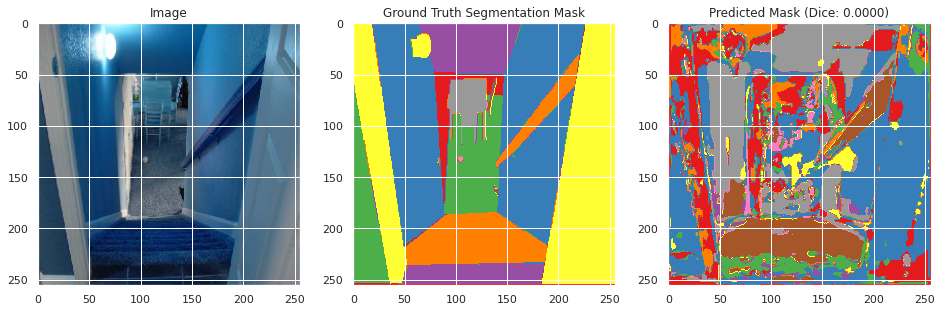

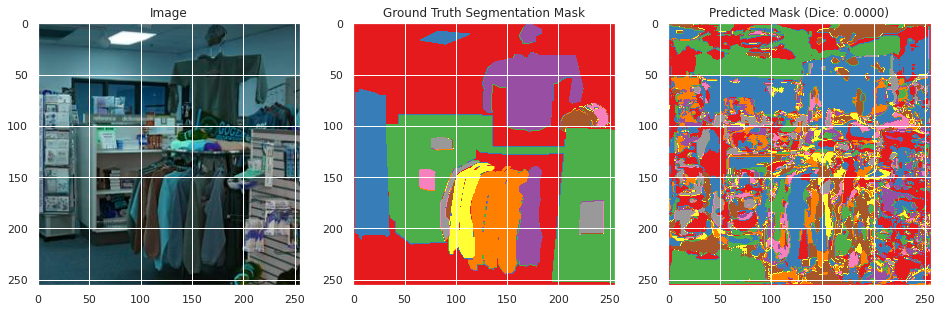

In [24]:
evaluate(model, X_test, Y_test)

Evaluation on training and validation data:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


Mean Test Dice: 0.0036
Mean Test Accuracy: 0.6008


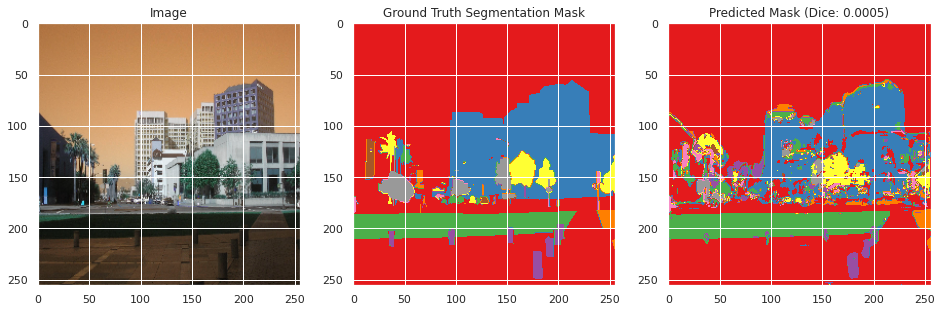

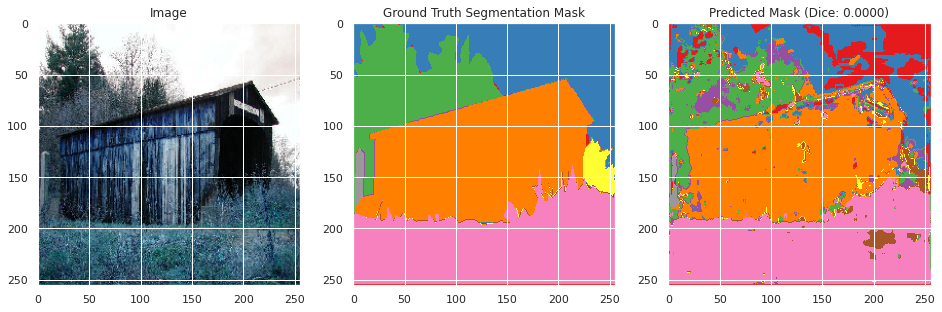

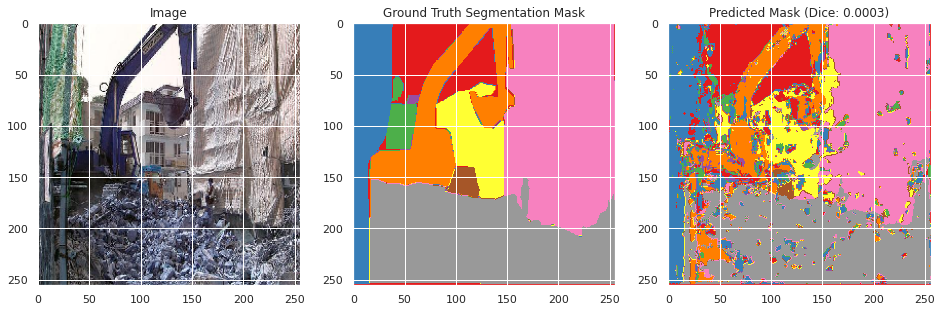

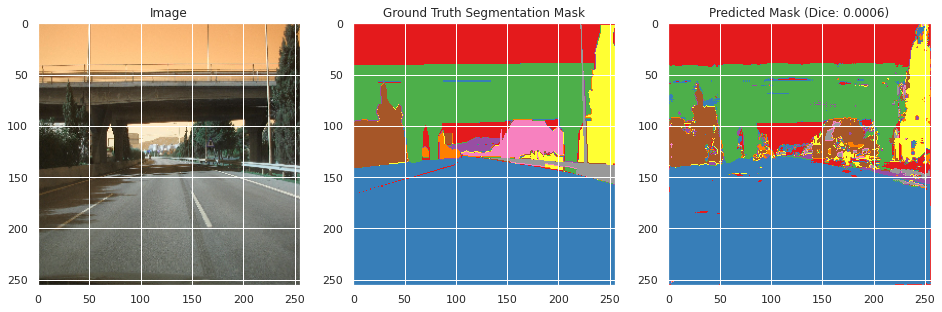

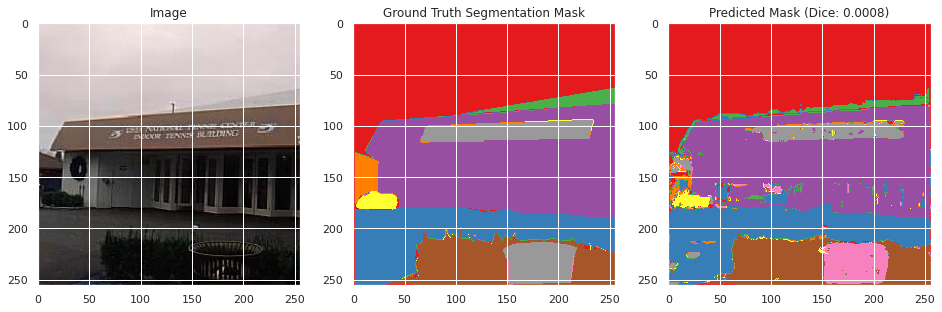

...

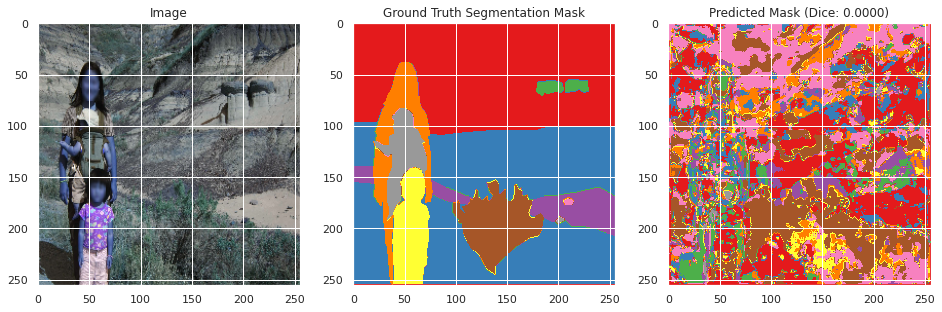

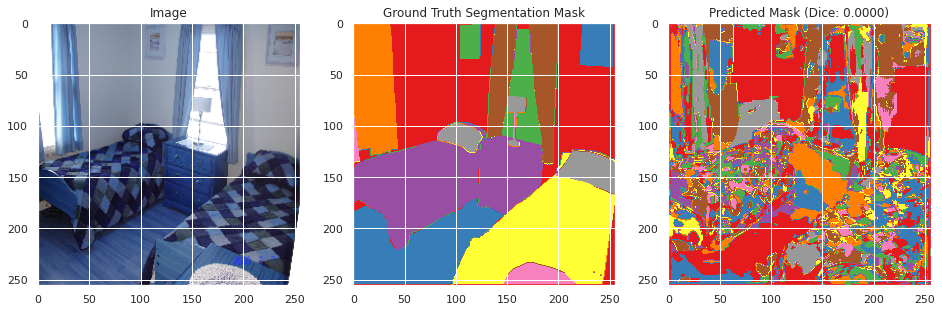

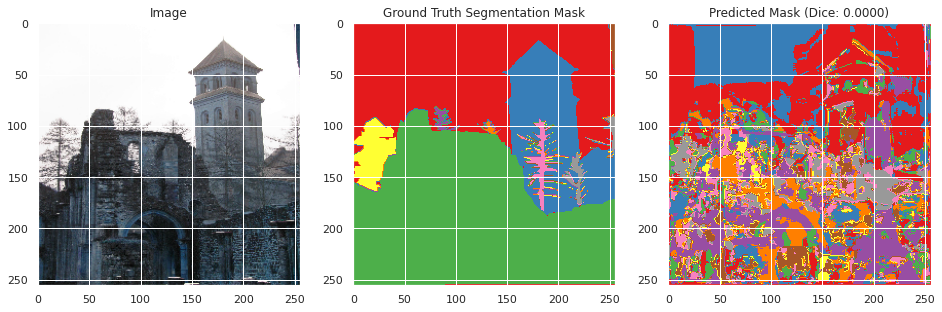

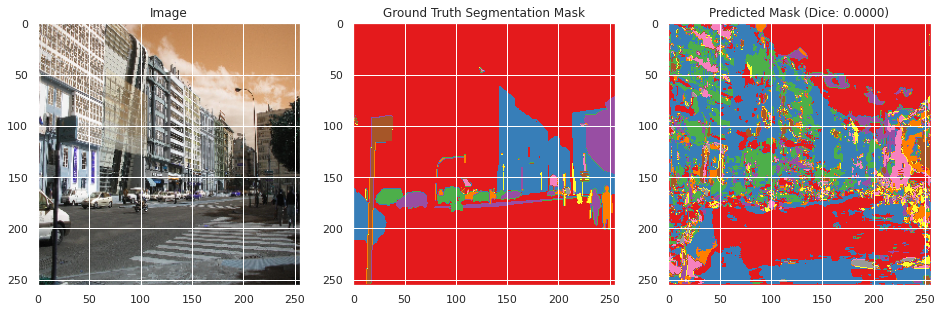

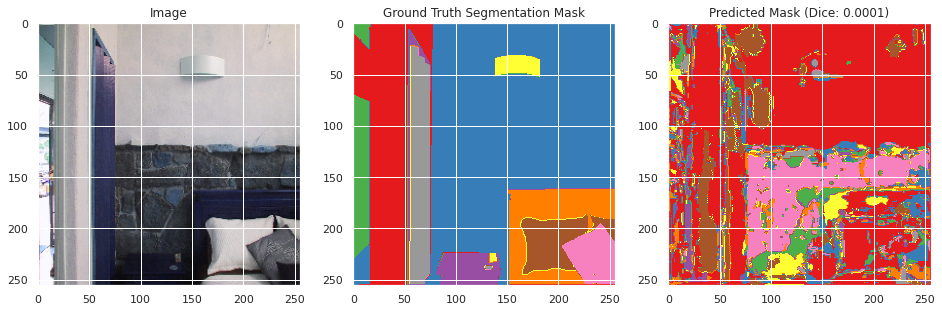

In [25]:
evaluate(model, X_train, Y_train)

## Proglearn LifelongClassificationNetwork

An attempt at implementing the previously used procedure for image segmentation was made in the Proglearn framework. This was done by passing a Unet network into the `LifelongClassificationNetwork` constructor. This is initially successful, but attempting to add a task to the network produces an error as the use of the `check_X_y()` scikit-learn function will produce an error if the `y` array is not one dimensional. As such, Progleanr in its current state is only compatible with prediction tasks where the output is one-dimensional, making it incompatible with the image segmentation task whose output is two-dimensional.